<a href="https://colab.research.google.com/github/roger-yu-ds/image_captioning_neural_network/blob/master/image_caption1_attention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Capture using VGG16 + Attention #

# Data
In google My Drive I have:

- Flickr8k_Dataset.zip
- Flickr8k_text.zip
- glove.6B.zip

Then, you should be able to run through the notebook as is..  

##VGG16 + Attention##
https://github.com/SubhamIO/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/blob/master/Image_Captioning_using_Attention_Mechanism.ipynb

##InceptionV3##
This is based on https://towardsdatascience.com/image-captioning-with-keras-teaching-computers-to-describe-pictures-c88a46a311b8 at the AT3 suggested models

# Mounting the Drive
The zipped image and text files are stored in Google My Drive, so first the drive is mounted and then the files are downloaded, accessible in /root/.keras/datasets/

In [2]:
%tensorflow_version 2.x
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
# Read the Images to Keras/datasets
import tensorflow as tf
file_url = 'file:///content/drive/My Drive/Flickr8k_Dataset.zip'
zip_dir = tf.keras.utils.get_file('Flickr8k_Dataset.zip', origin=file_url, extract=True)
print(zip_dir)

# Read the Text files
import tensorflow as tf
file_url = 'file:///content/drive/My Drive/Flickr8k_text.zip'
txt_dir = tf.keras.utils.get_file('Flickr8k_text.zip', origin=file_url, extract=True)
print(txt_dir)

# Read the Text files
import tensorflow as tf
file_url = 'file:///content/drive/My Drive/glove.6B.zip'
glv_dir = tf.keras.utils.get_file('glove.6B.zip', origin=file_url, extract=True)
print(glv_dir)


1115422720/1115419746 [==============================] - 26s 0us/step
/root/.keras/datasets/Flickr8k_Dataset.zip
2342912/2340801 [==============================] - 1s 0us/step
/root/.keras/datasets/Flickr8k_text.zip
862183424/862182613 [==============================] - 46s 0us/step
/root/.keras/datasets/glove.6B.zip


In [10]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
import pickle #import dump, load
from time import time
import tensorflow as tf

from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization, add, Add, concatenate
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras import Input, layers
from tensorflow.keras import optimizers
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from keras.backend.tensorflow_backend import set_session

import matplotlib.pyplot as plt
from collections import Counter 
import seaborn as sns
import sys, os, warnings 
import re
from pickle import load
from pickle import dump
import datetime

# Scikit-learn includes many helpful utilities
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
from os import listdir
## The location of the Flickr8K_ photos
image_dir = '/root/.keras/datasets/Flicker8k_Dataset'
images = listdir(image_dir)
print(images)

## The location of the caption file
descriptions_dir = '/root/.keras/datasets/Flickr8k.token.txt'

print("The number of jpg flies in Flicker8k: {}".format(len(images)))

['1606988704_fe330878a3.jpg', '264859622_f3a00ab409.jpg', '3342309960_c694b2cce9.jpg', '542405691_0594b1ce72.jpg', '883040210_3c4a10f030.jpg', '2953015871_cae796b6e7.jpg', '143688283_a96ded20f1.jpg', '3446191973_1db572ed8a.jpg', '2218519240_cac5aab53c.jpg', '1527513023_3d8152b379.jpg', '3014169370_fc4059352e.jpg', '3504275465_604ce2ef34.jpg', '2908512223_7e27631ed4.jpg', '3364026240_645d533fda.jpg', '3594566537_55bd712fdb.jpg', '2100816230_ff866fb352.jpg', '3144705706_391d7b77c7.jpg', '2746072388_b127f8259b.jpg', '2623496164_68ffeb5067.jpg', '3375534917_62350bd06b.jpg', '128912885_8350d277a4.jpg', '3459858555_c3f0087a72.jpg', '2785115802_137fa30000.jpg', '2533414541_362bf043bb.jpg', '315880837_90db309bab.jpg', '309238565_2d5d8dc8bf.jpg', '2557507575_b247f145bc.jpg', '391020801_aaaae1e42b.jpg', '2831313661_1a328acb70.jpg', '3154886184_ac842655b6.jpg', '397547349_1fd14b95af.jpg', '481827288_a688be7913.jpg', '3499720588_c32590108e.jpg', '3689355450_fd559b816d.jpg', '532036676_e88b13e0a1.j

# Loading the Data and Cleaning
Read the token file which contains the captions for each image.  There are 5 captions per image.  The structure of the file is:
- ![alt text](https://)filename#Caption number (0-4)[TAB]Caption

For example:

`1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .`

In [0]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

root_directory = '/root/.keras/datasets/'
filename = root_directory + "Flickr8k.token.txt"
# load descriptions
doc = load_doc(filename)

In [6]:
## read in the Flickr caption data
text = load_doc(descriptions_dir)
print(text[:325])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the stairs to her playhouse .



In [7]:
#Making a dataframe out of raw text
def make_dataset(text):
  df = []
  for sentences in text.split('\n'):
      splitted = sentences.split('\t')
      if len(splitted) == 1:
          continue
      w = splitted[0].split("#")
      df.append(w + [splitted[1].lower()])
  return df


df = make_dataset(text)
df[:10]  

[['1000268201_693b08cb0e.jpg',
  '0',
  'a child in a pink dress is climbing up a set of stairs in an entry way .'],
 ['1000268201_693b08cb0e.jpg', '1', 'a girl going into a wooden building .'],
 ['1000268201_693b08cb0e.jpg',
  '2',
  'a little girl climbing into a wooden playhouse .'],
 ['1000268201_693b08cb0e.jpg',
  '3',
  'a little girl climbing the stairs to her playhouse .'],
 ['1000268201_693b08cb0e.jpg',
  '4',
  'a little girl in a pink dress going into a wooden cabin .'],
 ['1001773457_577c3a7d70.jpg',
  '0',
  'a black dog and a spotted dog are fighting'],
 ['1001773457_577c3a7d70.jpg',
  '1',
  'a black dog and a tri-colored dog playing with each other on the road .'],
 ['1001773457_577c3a7d70.jpg',
  '2',
  'a black dog and a white dog with brown spots are staring at each other in the street .'],
 ['1001773457_577c3a7d70.jpg',
  '3',
  'two dogs of different breeds looking at each other on the road .'],
 ['1001773457_577c3a7d70.jpg',
  '4',
  'two dogs on pavement moving t

In [11]:
data = pd.DataFrame(df,columns=["filename","index","caption"])
# Reordering columns for better readability
data = data.reindex(columns =['index','filename','caption'])

data

,index,filename,caption
0,0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
1,1,1000268201_693b08cb0e.jpg,a girl going into a wooden building .
2,2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse .
3,3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...
4,4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...
...,...,...,...
40455,0,997722733_0cb5439472.jpg,a man in a pink shirt climbs a rock face
40456,1,997722733_0cb5439472.jpg,a man is rock climbing high in the air .
40457,2,997722733_0cb5439472.jpg,a person in a red shirt climbing up a rock fac...
40458,3,997722733_0cb5439472.jpg,a rock climber in a red shirt .


In [12]:
# If any filename dosn't have .jpg extension at last then mark it as Invalid filename
def invalid_filename_check(data):
  for filenames in data["filename"]:
    found = re.search("(.(jpg)$)", filenames)
    if (found):
        pass
    else:
        print("Error file: {}".format(filenames))

invalid_filename_check(data)    

data[data['filename'] == "2258277193_586949ec62.jpg.1"]

Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1


,index,filename,caption
6730,0,2258277193_586949ec62.jpg.1,people waiting for the subway
6731,1,2258277193_586949ec62.jpg.1,some people looking out windows in a large bui...
6732,2,2258277193_586949ec62.jpg.1,three people are waiting on a train platform .
6733,3,2258277193_586949ec62.jpg.1,three people standing at a station .
6734,4,2258277193_586949ec62.jpg.1,two woman and one man standing near train trac...


In [13]:
# We must remove this error file from out dataset
data = data[data['filename'] != '2258277193_586949ec62.jpg.1']
data.shape

(40455, 3)

## Exploring the dataframe ##

In [14]:
def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print(ct_dict)

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames


unique_filenames = utility_counter(data)  

The number of unique file names : 8091
We can see that all the keys are having values count = 5
Counter({'1000268201_693b08cb0e.jpg': 5, '1001773457_577c3a7d70.jpg': 5, '1002674143_1b742ab4b8.jpg': 5, '1003163366_44323f5815.jpg': 5, '1007129816_e794419615.jpg': 5, '1007320043_627395c3d8.jpg': 5, '1009434119_febe49276a.jpg': 5, '1012212859_01547e3f17.jpg': 5, '1015118661_980735411b.jpg': 5, '1015584366_dfcec3c85a.jpg': 5, '101654506_8eb26cfb60.jpg': 5, '101669240_b2d3e7f17b.jpg': 5, '1016887272_03199f49c4.jpg': 5, '1019077836_6fc9b15408.jpg': 5, '1019604187_d087bf9a5f.jpg': 5, '1020651753_06077ec457.jpg': 5, '1022454332_6af2c1449a.jpg': 5, '1022454428_b6b660a67b.jpg': 5, '1022975728_75515238d8.jpg': 5, '102351840_323e3de834.jpg': 5, '1024138940_f1fefbdce1.jpg': 5, '102455176_5f8ead62d5.jpg': 5, '1026685415_0431cbf574.jpg': 5, '1028205764_7e8df9a2ea.jpg': 5, '1030985833_b0902ea560.jpg': 5, '103106960_e8a41d64f8.jpg': 5, '103195344_5d2dc613a3.jpg': 5, '103205630_682ca7285b.jpg': 5, '10321

Then read in the text and split out the filename and description separately.  This goes into a dictionary where the key is the filename and the 5 desciptions are added as the item.


In [15]:
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# extract filename from image id
		image_id = image_id.split('.')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping

# parse descriptions
descriptions = load_descriptions(doc)
descriptions_b4_clean = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


Clean the text by:
- Removing punctuation
- making everything lower case
- remove hanging 's' and 'a'
- remove numbers

In [0]:
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)

Now create a vocabulary of words, so take the descriptions and make a list of unique words.

In [17]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 8763


Then save the descriptions to file.

In [0]:
# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(descriptions, 'descriptions.txt')

# Load the Images
trainImages.txt contains the filenames that are to be used for training.  This file is read in, the filetype is stripped off and the filename is saved to a list.

In [19]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = root_directory +  'Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))
validation = load_set(root_directory +  'Flickr_8k.devImages.txt')
print('Dataset: %d' % len(validation))

Dataset: 6000
Dataset: 1000


Then save a list of images, ready for loading.

In [0]:
# Below path contains all the images
images = root_directory + 'Flicker8k_Dataset/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

Now load the set of train image filenames to a list and the set of test image filename to another in preparation of loading the images.

In [0]:
# Below file conatains the names of images to be used in train data
train_images_file = root_directory + 'Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images

In [0]:
# Below file conatains the names of images to be used in test data
test_images_file = root_directory + 'Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images

In [0]:
# Below file conatains the names of images to be used in test data
val_images_file = root_directory + 'Flickr_8k.devImages.txt'
# Read the validation image names in a set# Read the test image names in a set
val_images = set(open(val_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
val_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in val_images: # Check if the image belongs to test set
        val_img.append(i) # Add it to the list of test images

Load the training descriptions from the file of descriptions created earlier. 'startseq' is added before the caption to denote the start of the sentence and 'endseq' is added at the end to denote the end of the sentence. 


In [24]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))
val_descriptions = load_clean_descriptions('descriptions.txt', validation)
print('Descriptions: train=%d' % len(val_descriptions))

Descriptions: train=6000
Descriptions: train=1000


## Analysis of words and word sequences ##

In [0]:
# Adapted from:
# https://fairyonice.github.io/Develop_an_image_captioning_deep_learning_model_using_Flickr_8K_data.html

# visualize distribution of the words
def df_word(df_txt):
    df_desc = pd.DataFrame.from_dict(df_txt, orient='index', columns=['Cap1', 'Cap2', 'Cap3', 'Cap4', 'Cap5']).reset_index()
    df_desc = pd.melt(df_desc, id_vars='index', var_name='key', value_name='value')
    df_desc.rename(columns={'index':'filename', 'value':'caption'}, inplace=True)
    df_desc = df_desc.reset_index().drop(columns=['key'])

    df_vocabulary = []
    for txt in df_desc.caption.values:
        df_vocabulary.extend(txt.split())
    print('Vocabulary Size: %d' % len(set(df_vocabulary)))

    ct = Counter(df_vocabulary)

    #can't get this next line to work
    #dfword = pd.DataFrame({"word":ct.keys(),"count":ct.values()})

    #alternative - create word & count dataframes, then merge into one
    key = pd.DataFrame(ct.keys()).reset_index().rename(columns={0:'word'})
    value = pd.DataFrame(ct.values()).reset_index().rename(columns={0:'count'})

    dfword = key.merge(value, on='index', how='inner')
    dfword = dfword.sort_values('count',ascending=False).reset_index()

    return dfword

#------------------------------------------------
# most and least frequently appearing words
import seaborn as sns
def plthist(dfsub, title="The top 50 most frequently appearing words"):
    sns.set(style='whitegrid')
    plt.figure(figsize=(20,3))
    plt.bar(dfsub.index,dfsub["count"])
    sns.barplot(dfsub.word,dfsub["count"])
    plt.yticks(fontsize=16)
    plt.xticks(rotation=90,fontsize=16)  #dfsub.index,dfsub["word"],
    plt.title(title,fontsize=16)
    plt.show()


### Visually show Top 50 Most & Least used words ###

Vocabulary Size: 9630


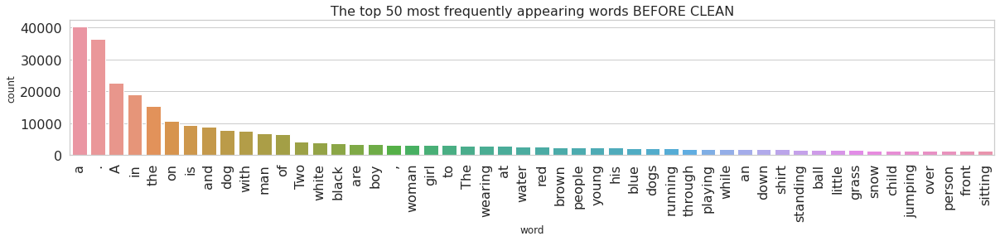

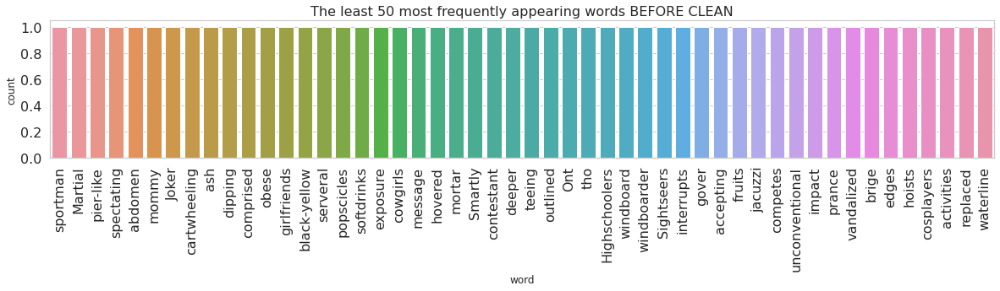

In [19]:
# Visually show top 50 used / least used words BEFORE CLEAN

# visualize distribution of the words
dfword = df_word(descriptions_b4_clean)

topn = 50

# most and least frequently appearing words
plthist(dfword.iloc[:topn,:],  title="The top 50 most frequently appearing words BEFORE CLEAN")

plthist(dfword.iloc[-topn:,:], title="The least 50 most frequently appearing words BEFORE CLEAN")

### Top 50 Most & Least used words AFTER CLEAN ###

Vocabulary Size: 8763


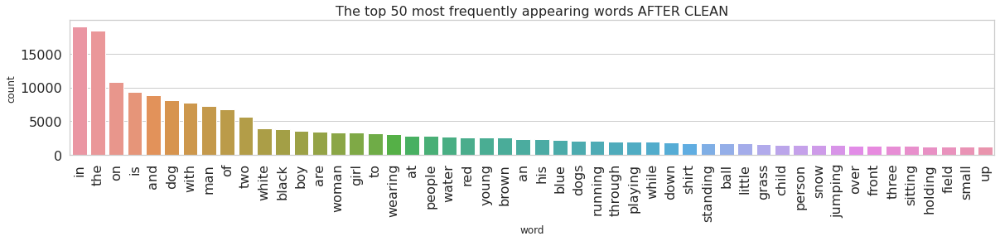

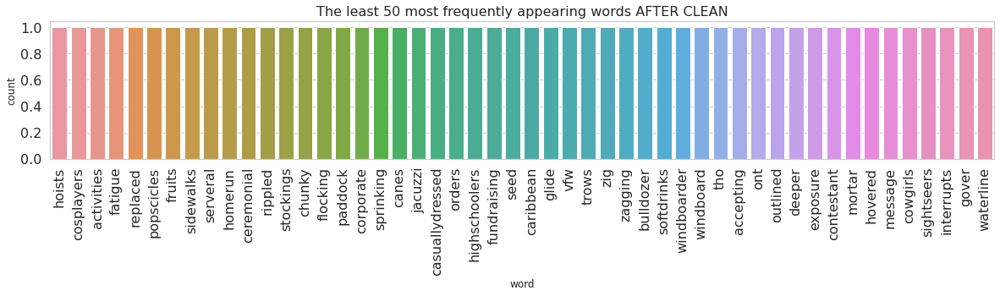

In [20]:
# Visually show top 50 used / least used words AFTER CLEAN

# visualize distribution of the words
df_desc_word = df_word(descriptions)

topn = 50

# most and least frequently appearing words
plthist(df_desc_word.iloc[:topn,:],  title="The top 50 most frequently appearing words AFTER CLEAN")

plthist(df_desc_word.iloc[-topn:,:], title="The least 50 most frequently appearing words AFTER CLEAN")

### Display some images and their captions ###

Using TensorFlow backend.


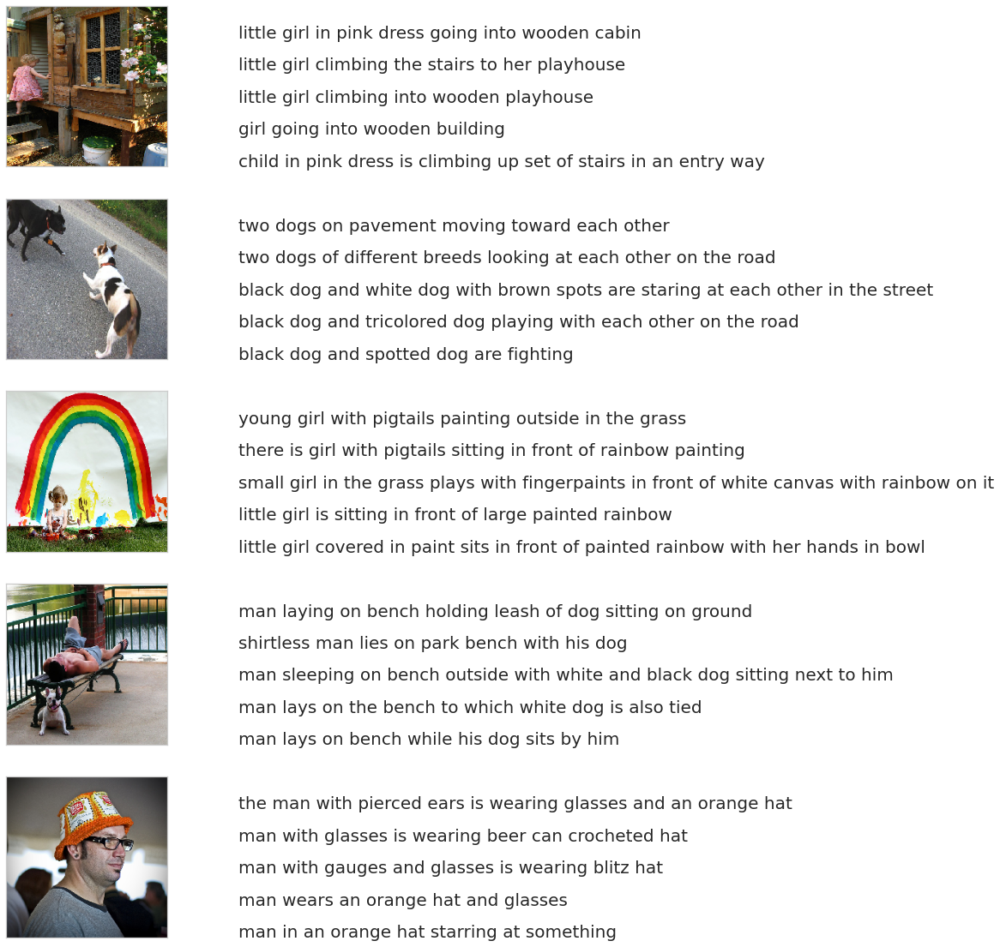

In [21]:
# Display some images with their captions
# Adapted from: https://fairyonice.github.io/Develop_an_image_captioning_deep_learning_model_using_Flickr_8K_data.html
from keras.preprocessing.image import load_img, img_to_array

def plot_image_caption(uni_filenames, npic=5, npix=224):
    target_size = (npix,npix,3)

    count = 1
    fig = plt.figure(figsize=(10,20))
    for jpgfnm in uni_filenames[:npic]:
        filename = images + jpgfnm + '.jpg'
        captions = list(df_txt["caption"].loc[df_txt["filename"]==jpgfnm].values)
        image_load = load_img(filename, target_size=target_size)
        
        ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
        ax.imshow(image_load)
        count += 1
        
        ax = fig.add_subplot(npic,2,count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,len(captions))
        for i, caption in enumerate(captions):
            ax.text(0,i,caption,fontsize=20)
        count += 1
    plt.show()


#---------------------------------------------------
# setup filename & caption from cleaned descriptions
df_txt = pd.DataFrame.from_dict(descriptions, orient='index', columns=['Cap1', 'Cap2', 'Cap3', 'Cap4', 'Cap5']).reset_index()
df_txt = pd.melt(df_txt, id_vars='index', var_name='key', value_name='value')
df_txt.rename(columns={'index':'filename', 'value':'caption'}, inplace=True)
df_txt = df_txt.reset_index().drop(columns=['key'])

uni_filenames = np.unique(df_txt['filename'])
npic = 5
npix = 224

plot_image_caption(uni_filenames, npic, npix)

Create a function to preprocess each image for the inception model.  This will load the image in the correct size and format (nimpy array) and scale pixels between -1 and 1.

### Preprocessing the images ###

Setting the path for each image so that we can load the images at once using the path set



In [26]:
def preprocess_images(data):
  all_img_name_vector = []

  for filenames in data["filename"]:
      full_image_path = image_dir+"/"+ filenames
      all_img_name_vector.append(full_image_path)
  return all_img_name_vector
all_img_name_vector = preprocess_images(data)
all_img_name_vector[:10]

['/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg']

**Preprocessing**( the captions (adding '< start >' and '< end >' tags to every caption), so that out ML model understands the starting and ending of each caption.

In [27]:
 def preprocess_captions(data):
  total_captions = []

  for caption  in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions
  
total_captions = preprocess_captions(data)
total_captions[:10]

['<start> a child in a pink dress is climbing up a set of stairs in an entry way . <end>',
 '<start> a girl going into a wooden building . <end>',
 '<start> a little girl climbing into a wooden playhouse . <end>',
 '<start> a little girl climbing the stairs to her playhouse . <end>',
 '<start> a little girl in a pink dress going into a wooden cabin . <end>',
 '<start> a black dog and a spotted dog are fighting <end>',
 '<start> a black dog and a tri-colored dog playing with each other on the road . <end>',
 '<start> a black dog and a white dog with brown spots are staring at each other in the street . <end>',
 '<start> two dogs of different breeds looking at each other on the road . <end>',
 '<start> two dogs on pavement moving toward each other . <end>']

## View some image examples ##

In [28]:
ten_images = all_img_name_vector[:50] # Each image repeats 5 times in dataset
unique_images = np.unique(ten_images)
print(unique_images)

['/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1003163366_44323f5815.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1007129816_e794419615.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1007320043_627395c3d8.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1009434119_febe49276a.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1012212859_01547e3f17.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1015118661_980735411b.jpg'
 '/root/.keras/datasets/Flicker8k_Dataset/1015584366_dfcec3c85a.jpg']


Total Images : 40455
Total Captions : 40455


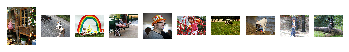

In [76]:
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

def showImagesHorizontally(ten_images):
    fig = figure()
    number_of_files = len(ten_images)
    for i in range(number_of_files):
        a=fig.add_subplot(1,number_of_files,i+1)
        image = imread(ten_images[i])
        imshow(image,cmap='Greys_r', aspect='equal', interpolation='nearest')
        axis('off')

showImagesHorizontally(unique_images)

print("Total Images : " + str(len(all_img_name_vector)))
print("Total Captions : " + str(len(total_captions)))

**Reducing and Shuffling** Data to acheive an optimal batch size

In [29]:
# o that we can select batch size properly i.e. 625 batches if batch_size=64
def data_limiter(num,total_captions,all_img_name_vector):
  # Shuffle captions and image_names together
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  train_captions = train_captions[:num]
  img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector

train_captions,img_name_vector = data_limiter(40000,total_captions,all_img_name_vector)

print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 40000 , Total images = 40000


###Save variables in a pickle file and restore them to use it again##

In [30]:
# save to file
dump(train_captions, open('captions.pkl', 'wb'))
dump(img_name_vector, open('img_names.pkl', 'wb'))

train_captions = load(open('captions.pkl', 'rb'))
img_name_vector = load(open('img_names.pkl', 'rb'))

print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 40000 , Total images = 40000


### Check out some image shapes ###

In [31]:
# The shape of images
def img_shape_finder(image):
  img= plt.imread(image)

  print("Shape of the image ==> {0} is ==> {1}".format(image.split('/')[1],img.shape))

img_list=[]
for i in range(20):
  img_list.append(img_name_vector[i])

for j in img_list:
  img_shape_finder(j)  

Shape of the image ==> root is ==> (500, 375, 3)
Shape of the image ==> root is ==> (375, 500, 3)
Shape of the image ==> root is ==> (375, 500, 3)
Shape of the image ==> root is ==> (400, 500, 3)
Shape of the image ==> root is ==> (274, 500, 3)
Shape of the image ==> root is ==> (375, 500, 3)
Shape of the image ==> root is ==> (334, 500, 3)
Shape of the image ==> root is ==> (500, 354, 3)
Shape of the image ==> root is ==> (500, 333, 3)
Shape of the image ==> root is ==> (350, 500, 3)
Shape of the image ==> root is ==> (375, 500, 3)
Shape of the image ==> root is ==> (375, 500, 3)
Shape of the image ==> root is ==> (322, 500, 3)
Shape of the image ==> root is ==> (375, 500, 3)
Shape of the image ==> root is ==> (500, 333, 3)
Shape of the image ==> root is ==> (333, 500, 3)
Shape of the image ==> root is ==> (228, 500, 3)
Shape of the image ==> root is ==> (500, 333, 3)
Shape of the image ==> root is ==> (375, 500, 3)
Shape of the image ==> root is ==> (375, 500, 3)


### For VGG16 all images must have shape (2124, 224, 3) ###


Shape of the image:(333, 500, 3)


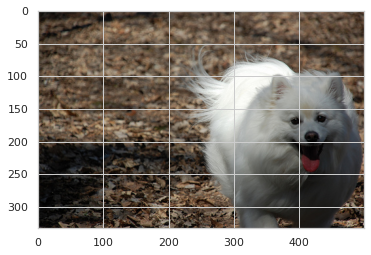

In [89]:
# To know the shape of images
def image_and_shapes(image):
  img= plt.imread(image)
  plt.imshow(img)
  print("Shape of the image:{}".format(img.shape))

image_and_shapes(image_dir + "/3439243433_d5f3508612.jpg")

# Image Augmentation # 
To help the model train on different variations of an image

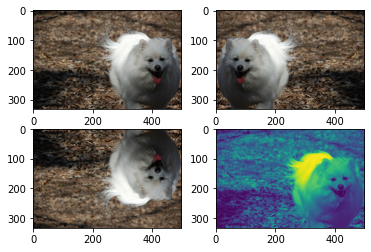

In [32]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  
  plt.figure(1)

#Original Image

  plt.subplot(221)
  plt.imshow(original_img)

#Left-Right flip Image

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Up-Down flip Image

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Gray scale Image

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

  #plt.imsave('doggo.jpg',flipped_img)

image_flipper(image_dir + "/3439243433_d5f3508612.jpg")

# Resize Image #
For VGG16 model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (224, 224, 3)


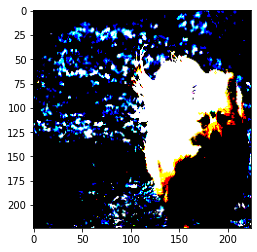

In [33]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = preprocess_input(img)
    return img, image_path

img1,img1_path = load_image(image_dir + "/3439243433_d5f3508612.jpg")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

# Image Histograms #
Histogram is considered as a graph or plot which is related to frequency of pixels in an Gray Scale Image with pixel values (ranging from 0 to 255). Grayscale image is an image in which the value of each pixel is a single sample, that is, it carries only intensity information where pixel value varies from 0 to 255.

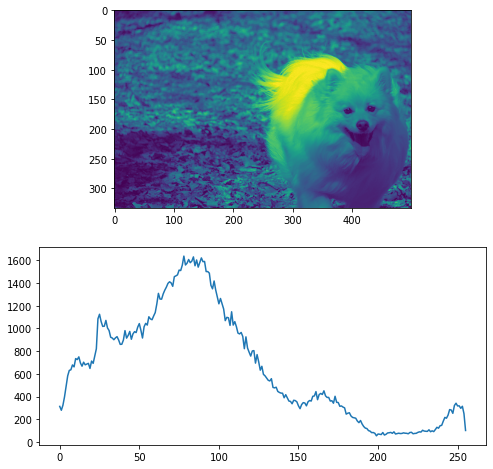

In [34]:
# importing required libraries of opencv 
import cv2 
# importing library for plotting 
from matplotlib import pyplot as plt 

def plot_image_histograms(image): 
  # reads an input image 
  img = cv2.imread(image,0) 
  # find frequency of pixels in range 0-255 
  histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
    
  # show the plotting graph of an image 
  fig = plt.figure(figsize=(8, 8))
  plt.subplot(2,1,1)
  plt.imshow(img)
  plt.subplot(2,1,2)
  plt.plot(histr) 
  plt.show() 

plot_image_histograms(image_dir + '/3439243433_d5f3508612.jpg')

# Pre-Trained Image Model (VGG16) #
The following creates an instance of the VGG16 model using the Keras API. This automatically downloads the required files if you don't have them already.

The VGG16 model was pre-trained on the ImageNet data-set for classifying images. The VGG16 model contains a convolutional part and a fully-connected (or dense) part which is used for the image classification.

If include_top=True then the whole VGG16 model is downloaded which is about 528 MB. If include_top=False then only the convolutional part of the VGG16 model is downloaded which is just 57 MB.

We will use some of the fully-connected layers in this pre-trained model, so we have to download the full model, but if you have a slow internet connection, then you can try and modify the code below to use the smaller pre-trained model without the classification layers.

In [35]:
import tensorflow as tf
modelvgg = tf.keras.applications.VGG16(include_top=True,weights=None) # for observation on shapes

modelvgg.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

Normally, the CNN's last layer is the softmax layer, which assigns the probability that each object might be in the image. But, if we remove that softmax layer from CNN, we can feed the CNN's rich encoding of the image into the DECODER(language generation of RNN) designed to produce phrases. We can then train the whole system directly on images and their captions, so it maximizes the likelihood that the descriptions it produces best match the training descriptions for each image

In [36]:
image_model = tf.keras.applications.VGG16(include_top=False,weights='imagenet')
new_input = image_model.input # Any arbitrary shapes with 3 channels
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

58892288/58889256 [==============================] - 1s 0us/step


In [37]:
image_features_extract_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

# VGG16 Feature Extraction #

In [38]:
# Get unique images
encode_train = sorted(set(img_name_vector))
print(encode_train[:10])

['/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1003163366_44323f5815.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1007129816_e794419615.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1007320043_627395c3d8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1009434119_febe49276a.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1012212859_01547e3f17.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1015118661_980735411b.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1015584366_dfcec3c85a.jpg']


In [39]:
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)

x = 0
n_step = 700

for files in image_dataset: 
    x = x + 1
    # Print the cost every n_step
    if x % n_step == 0:
        print(files.numpy())

b'/root/.keras/datasets/Flicker8k_Dataset/1773928579_5664a810dc.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/2273591668_069dcb4641.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/2503629305_055e9ec4b1.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/2735979477_eef7c680f9.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/2950393735_9969c4ec59.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/3143155555_32b6d24f34.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/3286045254_696c6b15bd.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/3429641260_2f035c1813.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/3564436847_57825db87d.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/3717809376_f97611ab84.jpg'
b'/root/.keras/datasets/Flicker8k_Dataset/539751252_2bd88c456b.jpg'


## Map each image name to the function to load the image ##

In [40]:
# Feel free to change batch_size according to your system configuration
n_batch = 64
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(n_batch)

# all the images have been resized to (224,224,3)
image_dataset

<BatchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.string)>

An NPY file is a NumPy array file created by the Python software package with the NumPy library installed. It contains an array saved in the NumPy (NPY) file format. NPY files store all the information required to reconstruct an array on any computer, which includes dtype and shape information.

In [41]:
# WARNING: This takes a long time - suggest running GPU
from tqdm import tqdm
for img, path in tqdm(image_dataset):
   batch_features = image_features_extract_model(img)
   batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))
   for bf, p in zip(batch_features, path):
     path_of_feature = p.numpy().decode("utf-8")
     np.save(path_of_feature, bf.numpy())

127it [01:52,  1.13it/s]


In [42]:
np_img=np.load(image_dir + '/3338291921_fe7ae0c8f8.jpg.npy')

print(np_img)
print("Shape : {}".format(np_img.shape))

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        3.9950507 0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]
Shape : (49, 512)



# Data Preparation for a Language Generation(RNN) DECODER #
We will perform a few basic pre-processing steps on the captions such as:
First, we will tokenize the captions. This will help us to build a vocabulary of all the unique words in the data.
Next, we will limit the vocabulary size to top 5000 words to save memory. We will replace all the other words with the token < unk > (for words not in vocabulary) . You , can obviously optimize that according to the use cases.
Finally, we will create a word->index mapping and vice versa.
We will pad all sequences to be the same length as the longest one.

# Tokenizing the captions and creating vocabulary #

In [0]:
def tokenize_caption(top_k,train_captions):
  # Choose the top 5000 words from the vocabulary
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,oov_token="<unk>",filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  # oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
  
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'

  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

train_seqs , tokenizer = tokenize_caption(5000,train_captions)

In [119]:
train_captions[:3]

['<start> several children leaping into a pile of leaves on the ground . <end>',
 '<start> a man hiking in the wilderness giving the camera a thumbs up . <end>',
 '<start> a white dog is running through the water onto the shore . <end>']

In [120]:
train_seqs[:3] # Here we can see that the sentences are converted to sequences

[[3, 188, 63, 335, 65, 2, 528, 13, 333, 7, 6, 170, 4],
 [3, 2, 12, 596, 5, 6, 2419, 906, 6, 93, 2, 1186, 52, 4],
 [3, 2, 15, 10, 8, 33, 34, 6, 25, 241, 6, 286, 4]]

- Here we can see that the size of each caption vectors are different.
- we need to pad the vector upto max_length of the caption

In [122]:
# oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
tokenizer.oov_token

'<unk>'

In [123]:
tokenizer.index_word

{1: '<unk>',
 2: 'a',
 3: '<start>',
 4: '<end>',
 5: 'in',
 6: 'the',
 7: 'on',
 8: 'is',
 9: 'and',
 10: 'dog',
 11: 'with',
 12: 'man',
 13: 'of',
 14: 'two',
 15: 'white',
 16: 'black',
 17: 'boy',
 18: 'are',
 19: 'woman',
 20: 'girl',
 21: 'to',
 22: 'wearing',
 23: 'at',
 24: 'people',
 25: 'water',
 26: 'red',
 27: 'young',
 28: 'brown',
 29: 'an',
 30: 'his',
 31: 'blue',
 32: 'dogs',
 33: 'running',
 34: 'through',
 35: 'playing',
 36: 'while',
 37: 'shirt',
 38: 'down',
 39: 'standing',
 40: 'ball',
 41: 'little',
 42: 'grass',
 43: 'child',
 44: 'snow',
 45: 'person',
 46: 'jumping',
 47: 'over',
 48: 'three',
 49: 'front',
 50: 'sitting',
 51: 'holding',
 52: 'up',
 53: 'field',
 54: 'small',
 55: 'by',
 56: 'green',
 57: 'large',
 58: 'one',
 59: 'yellow',
 60: 'group',
 61: 'her',
 62: 'walking',
 63: 'children',
 64: 'men',
 65: 'into',
 66: 'air',
 67: 'beach',
 68: 'near',
 69: 'mouth',
 70: 'jumps',
 71: 'another',
 72: 'for',
 73: 'street',
 74: 'its',
 75: 'runs',


In [125]:
tokenizer.word_counts

OrderedDict([('<start>', 40000),
             ('several', 308),
             ('children', 1136),
             ('leaping', 138),
             ('into', 1067),
             ('a', 62282),
             ('pile', 74),
             ('of', 6642),
             ('leaves', 139),
             ('on', 10624),
             ('the', 18233),
             ('ground', 356),
             ('<end>', 40000),
             ('man', 7202),
             ('hiking', 63),
             ('in', 18783),
             ('wilderness', 6),
             ('giving', 34),
             ('camera', 694),
             ('thumbs', 22),
             ('up', 1286),
             ('white', 3915),
             ('dog', 8048),
             ('is', 9266),
             ('running', 2049),
             ('through', 2012),
             ('water', 2764),
             ('onto', 211),
             ('shore', 169),
             ('young', 2598),
             ('relaxing', 15),
             ('his', 2327),
             ('legs', 130),
             ('pice', 1),
   

## MaxLength and MinLength of any captions ##

In [44]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

# Find the maximum length of any caption in our dataset
def calc_min_length(tensor):
    return min(len(t) for t in tensor)

# Calculates the max_length, which is used to store the attention weights
min_length = calc_min_length(train_seqs)

print('Max Length of any caption : Min Length of any caption = '+ str(max_length) + ' : ' + str(min_length))

Max Length of any caption : Min Length of any caption = 39 : 3


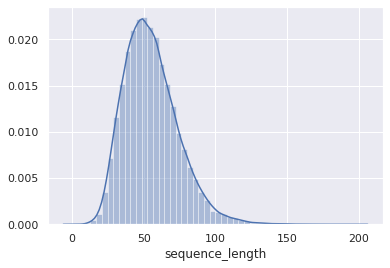

In [45]:
df=pd.DataFrame()
df["sequence_length"] = data["caption"].apply(len)

sns.set()
distribution = sns.distplot(df["sequence_length"])

## Pad each vector to the max_length of the captions, so that all caption vectors are of same length ##

In [46]:
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type,maxlen=max_length)
  return cap_vector

padded_caption_vector = padding_train_sequences(train_seqs,max_length,'post')
print(padded_caption_vector.shape)

padded_caption_vector

(40000, 39)


array([[  3, 188,  63, ...,   0,   0,   0],
       [  3,   2,  12, ...,   0,   0,   0],
       [  3,   2,  15, ...,   0,   0,   0],
       ...,
       [  3,   2,  20, ...,   0,   0,   0],
       [  3,   2,  17, ...,   0,   0,   0],
       [  3,   2, 156, ...,   0,   0,   0]], dtype=int32)

## Train-Test Split (80:20) ##

In [47]:
# Create training and test set using an 80-20 split
img_name_train, img_name_test, caption_train, caption_test = train_test_split(img_name_vector,padded_caption_vector,test_size=0.2,random_state=0)

print("Training Data : X = {0},Y = {1}".format(len(img_name_train), len(caption_train)))
print("Test Data : X = {0},Y = {1}".format(len(img_name_test), len(caption_test)))

Training Data : X = 32000,Y = 32000
Test Data : X = 8000,Y = 8000


## Creating dataset ##
### Loading the .npy files ###

In [0]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

def load_npy(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [0]:
'''
# How Dataset.from_tensor_slices work
t = tf.constant([[1, 2], [3, 4]])
ds = tf.data.Dataset.from_tensor_slices(t)   # [1, 2], [3, 4]
ds # <TensorSliceDataset shapes: (2,), types: tf.int32>
'''
def create_dataset(img_name_train,caption_train):
  
  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, caption_train))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(load_npy, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

# Creating train and test dataset
dataset = create_dataset(img_name_train,caption_train)
test_dataset = create_dataset(img_name_test,caption_test)
  

### Hyperparameters ###

In [0]:
embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1     #8329
num_steps = len(img_name_train) // BATCH_SIZE  #500
EPOCHS = 20
# Shape from last layer of VGG-16 :(7,7,512)
# So, say there are 49 pixel locations now and each pixel is 512 dimensional
features_shape = 512
attention_features_shape = 49

# CNN ENCODER #
Define the CNN ENCODER, that will be the single fully connected layer followed by ReLU activation.

In [0]:
# https://www.tensorflow.org/tutorials/text/image_captioning
class VGG16_Encoder(tf.keras.Model):
    # This encoder passes the features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(VGG16_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        #x= self.dropout(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [0]:
def rnn_type(units):
  # If you have a GPU, we recommend using CuDNNGRU(provides a 3x speedup than GRU)
  # the code automatically does that.
    if tf.test.is_gpu_available():
        return tf.compat.v1.keras.layers.CuDNNLSTM(units, 
                                        return_sequences=True, 
                                        return_state=True, 
                                        recurrent_initializer='glorot_uniform')
    else:
        return tf.keras.layers.GRU(units, 
                                   return_sequences=True, 
                                   return_state=True, 
                                   recurrent_activation='sigmoid', 
                                   recurrent_initializer='glorot_uniform')

# RNN DECODER and BAHDANAU ATTENTION(LOCAL ATTENTION) MECHANISM #
In the RNN Decoder we will also define the Attention Mechanism. We will need the features from the CNN ENCODER . This Attention Mechanism will return the context vector and attention weights over the time axis.

In [0]:
'''The encoder output(i.e. 'features'), hidden state(initialized to 0)(i.e. 'hidden') and 
the decoder input (which is the start token)(i.e. 'x') is passed to the decoder.'''

class Rnn_Local_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(Rnn_Local_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    
    self.fc1 = tf.keras.layers.Dense(self.units)

    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    # Implementing Attention Mechanism 
    self.Uattn = tf.keras.layers.Dense(units)
    self.Wattn = tf.keras.layers.Dense(units)
    self.Vattn = tf.keras.layers.Dense(1)
    


  def call(self, x, features, hidden):
    
    # features shape ==> (64,49,256) ==> Output from ENCODER
    
    # hidden shape == (batch_size, hidden_size) ==>(64,512)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)
    
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    
    # score shape == (64, 49, 1)
    # Attention Function
    '''e(ij) = f(s(t-1),h(j))'''
    ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''
    score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))
    # self.Uattn(features) : (64,49,512)
    # self.Wattn(hidden_with_time_axis) : (64,1,512)
    # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
    # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score
    # you get 1 at the last axis because you are applying score to self.Vattn
    
    
    # Then find Probability using Softmax
    '''attention_weights(alpha(ij)) = softmax(e(ij))'''
    attention_weights = tf.nn.softmax(score, axis=1)
    # attention_weights shape == (64, 49, 1)

    
    # Give weights to the different pixels in the image
    ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) ''' 
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
    # context_vector shape after sum == (64, 256)
    
    
    # x shape after passing through embedding == (64, 1, 256)
    x = self.embedding(x)
    
    # x shape after concatenation == (64, 1,  512)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # Adding Dropout and BatchNorm Layers
    x= self.dropout(x)
    x= self.batchnormalization(x)
    # output shape == (64 * 512)
    x = self.fc2(x)
    # shape : (64 * 8329(vocab))
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))
    

# RNN DECODER AND LUONG ATTENTION(GLOBAL ATTENTION) #

In [54]:
''' To choose score type: 
  Enter 'dot' for dot score
  Enter 'general' for general score
  Enter 'concat' for concat score
'''
def score_choose():
  scoring_type= input('Enter the scoring method: ')
  return scoring_type

scoring_type=score_choose()
  

Enter the scoring method: general


In [0]:
class Rnn_Global_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size,scoring_type):
        super(Rnn_Global_Decoder, self).__init__()
        

        self.units = units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        
        
        
        self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
        
        self.wc = tf.keras.layers.Dense(units, activation='tanh')
        self.ws = tf.keras.layers.Dense(vocab_size)

        #For Attention
        self.wa = tf.keras.layers.Dense(units)
        self.wb = tf.keras.layers.Dense(units)
        
        #For Score 3 i.e. Concat score
        self.Vattn = tf.keras.layers.Dense(1)
        self.wd = tf.keras.layers.Dense(units, activation='tanh')

        self.scoring_type = scoring_type

        
    def call(self, sequence, features,hidden):
        
        # features : (64,49,256)
        # hidden : (64,512)
        
        embed = self.embedding(sequence)
        # embed ==> (64,1,256) ==> decoder_input after embedding (embedding dim=256)
       
        output, state = self.gru(embed)       
        #output :(64,1,512)

        score=0
        
        #Dot Score as per paper(Dot score : h_t (dot) h_s') (NB:just need to tweak gru units to 256)
        '''----------------------------------------------------------'''
        if(self.scoring_type=='dot'):
          xt=output #(64,1,512)
          xs=features #(256,49,64)  
          score = tf.matmul(xt, xs, transpose_b=True) 
               
          #score : (64,1,49)

        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''



        # General Score as per Paper ( General score: h_t (dot) Wa (dot) h_s')
        '''----------------------------------------------------------'''
        if(self.scoring_type=='general'):
          score = tf.matmul(output, self.wa(features), transpose_b=True)
          # score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''




        # Concat score as per paper (score: VT*tanh(W[ht;hs']))    
        '''----------------------------------------------------------'''
        #https://www.tensorflow.org/api_docs/python/tf/tile
        if(self.scoring_type=='concat'):
          tiled_features = tf.tile(features, [1,1,2]) #(64,49,512)
          tiled_output = tf.tile(output, [1,49,1]) #(64,49,512)
          
          concating_ht_hs = tf.concat([tiled_features,tiled_output],2) ##(64,49,1024)
          
          tanh_activated = self.wd(concating_ht_hs)
          score =self.Vattn(tanh_activated)
          #score :(64,49,1), but we want (64,1,49)
          score= tf.squeeze(score, 2)
          #score :(64,49)
          score = tf.expand_dims(score, 1)
          
          #score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''



        # alignment vector a_t
        alignment = tf.nn.softmax(score, axis=2)
        # alignment :(64,1,49)

        # context vector c_t is the average sum of encoder output
        context = tf.matmul(alignment, features)
        # context : (64,1,256)
        
        # Combine the context vector and the LSTM output
        
        output = tf.concat([tf.squeeze(context, 1), tf.squeeze(output, 1)], 1)
        # output: concat[(64,1,256):(64,1,512)] = (64,768)

        output = self.wc(output)
        # output :(64,512)

        # Finally, it is converted back to vocabulary space: (batch_size, vocab_size)
        logits = self.ws(output)
        # logits/predictions: (64,8239) i.e. (batch_size,vocab_size))

        return logits, state, alignment

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))


In [56]:
''' Type: 'global' for Luong's Attention Mechanism(Global Attention) 
    Type: 'local' for Bahdanau's Attention Mechanism(Local Attention) 
'''
attention_choice = input("Choose the type of Attention Mechanism you want to apply :")

Choose the type of Attention Mechanism you want to apply :global


In [0]:
if(attention_choice=='local'):
    encoder = VGG16_Encoder(embedding_dim)
    decoder = Rnn_Local_Decoder(embedding_dim, units, vocab_size)

else:
    encoder = VGG16_Encoder(embedding_dim)
    decoder = Rnn_Global_Decoder(embedding_dim, units, vocab_size, scoring_type)

In [58]:
decoder

In [0]:
def Encoder_features(img_tensor, target):
   features = encoder(img_tensor)
   return features,target,img_tensor

for (batch, (img_tensor, target)) in enumerate(dataset):
   features,target,img_tensor= Encoder_features(img_tensor, target)

In [145]:
target.shape     #(batch_size,max_length)

TensorShape([64, 39])

In [146]:
img_tensor.shape #(batch_size,attention_feature_shape,feature_shape)

TensorShape([64, 49, 512])

In [147]:
features.shape  #(batch_size,attention_feature_shape,feature_shape)

TensorShape([64, 49, 256])

In [0]:
optimizer = tf.keras.optimizers.Adam()

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

# Saving Checkpoint #
TensorFlow objects provide an easy automatic mechanism for saving and restoring the values of variables they use.
All prefixes are grouped together in a single checkpoint file ('./tf_ckpts/checkpoint') where the CheckpointManager saves its state.

In [0]:
checkpoint_path_ckpt = "./checkpoint_finally19/train"

ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

# Training Step: #
The ENCODER output, hidden state(initialised to 0) and the DECODER input(which is the < start > token) are passed to the DECODER.
The DECODER returns the predictions and the DECODER hidden state.
The DECODER hidden state is then passed back into the model and the predictions are used to calculate the loss. While training, we use the Teacher Forcing technique, to decide the next input of the DECODER.
Teacher Forcing is the technique where the target word is passed as the next input to the DECODER. This technique helps to learn the correct sequence or correct statistical properties fro the sequence, quickly.
Final step is to calculate the Gradient and apply it to the optimizer and backpropagate

# Setup Tensorboard summary writer #

In [0]:
# Clear previous logs
%rm -rf ./logs/

# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [0]:
loss_plot = []

@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  #train_loss(loss)
  #train_accuracy(target, predictions)

  return loss, total_loss

In [0]:
test_loss_plot = []

@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder

      
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      # predictions : (64,8329)
      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*BATCH_SIZE, 1)
 

  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

# Training #

In [65]:
import time

for epoch in range(start_epoch, 20):
    start = time.time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss_train += t_loss
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss_train / num_steps)

    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train/ num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss
    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)
    
    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch + 1,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))


Epoch 1 TrainLoss 1.423625 TestLoss 0.488490
Time taken for 1 epoch 202.14142608642578 sec

Epoch 2 TrainLoss 1.192643 TestLoss 0.523789
Time taken for 1 epoch 156.27739787101746 sec

Epoch 3 TrainLoss 1.117815 TestLoss 0.543267
Time taken for 1 epoch 155.89357566833496 sec

Epoch 4 TrainLoss 1.097524 TestLoss 0.543865
Time taken for 1 epoch 156.02432513237 sec

Epoch 5 TrainLoss 1.069342 TestLoss 0.533133
Time taken for 1 epoch 156.65123391151428 sec

Epoch 6 TrainLoss 1.039839 TestLoss 0.512669
Time taken for 1 epoch 156.45538568496704 sec

Epoch 7 TrainLoss 1.018530 TestLoss 0.530014
Time taken for 1 epoch 155.6891360282898 sec

Epoch 8 TrainLoss 1.006280 TestLoss 0.519946
Time taken for 1 epoch 156.22601962089539 sec

Epoch 9 TrainLoss 1.012113 TestLoss 0.543508
Time taken for 1 epoch 156.03286385536194 sec

Epoch 10 TrainLoss 0.999905 TestLoss 0.519717
Time taken for 1 epoch 156.2160041332245 sec

Epoch 11 TrainLoss 0.990431 TestLoss 0.536202
Time taken for 1 epoch 156.17705082893

# Launching Tensorboard #

In [66]:
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

ckpt_manager.checkpoints

ckpt.restore('./checkpoint_finally19/train/ckpt-4')

<IPython.core.display.Javascript object>

# Plot the Train and Validation Losses to check for overfitting #

No handles with labels found to put in legend.


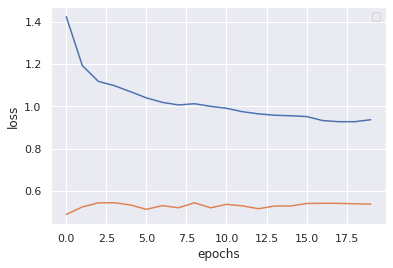

In [67]:
for label in [loss_plot,test_loss_plot]:
    plt.plot(label)
plt.legend()    
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

# Evaluating the Captioning Model #

### Greedy Approach ... evaluate(image) ###

In [0]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)
    
    #print('evaluate: ' + image)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append(tokenizer.index_word[predicted_id]) # Store the result or word predicted

        if tokenizer.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot


### Beam Search ... evaluate(image, beam) ###

In [0]:
def evaluate_beam(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption,attention_plot


## Helper function to visualise the attention points that predicts the words.##

In [0]:
# https://github.com/SubhamIO/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/blob/master/Image_Captioning_using_Attention_Mechanism.ipynb


In [0]:
import math
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))
    
    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    print('len(result)-init: ' + str(len_result))

    if len_result>=36:
        len_result=24
        ncol=8
        nrow=3
    elif len_result>=25:
        len_result=25
        ncol=5
        nrow=5
    elif len_result>=16:
        len_result=16
        ncol=4
        nrow=4
    elif len_result>=8:
        len_result = 8
        ncol=4
        nrow=2
    elif len_result>=5:
        ncol=len_result
        nrow=2
    elif len_result<5:
        ncol=len_result
        nrow=1
    else:  
        ncol=round(len_result // 2, 0) 
        nrow=2

    print('len(result)-post: ' + str(len_result))
    print('nrow: ' + str(nrow))
    #unit = round(len_result // unit, 0)
    #print('unit: ' + str(unit))

    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(nrow, ncol, l+1)  #ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    #plt.tight_layout()
    plt.show()


## Checkout few captions generated using Greedy Search vs Beam Search ##
### 1. Greedy prediction ###

In [0]:
# Greedy: captions on the validation set
from PIL import Image
from nltk.translate.bleu_score import sentence_bleu

def Predict_Greedy(img_name_test, rid=1234):
    if rid==1234:
        rid = np.random.randint(0, len(img_name_test))
    image = img_name_test[rid]
    print(image)
    print('rid: ' + str(rid))
    start = time.time()
    real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])

    # GREEDY Evaluation
    result, attention_plot = evaluate(image)

    # result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
    # We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in result:
        if i=="<unk>":
            result.remove(i)

    #remove <end> from result         
    result_join = ''.join(str(result))
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = result_final.split()

    score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))  
    print(f"BELU score: {score*100}")

    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', result_final)

    #plot_attention(image, result_final, attention_plot)
    plot_attention(image, result, attention_plot)

    print(f"time took to Predict: {round(time.time()-start)} sec")

    return image


/root/.keras/datasets/Flicker8k_Dataset/445861800_75fc6a8c16.jpg
rid: 1208
BELU score: 0
Real Caption: three people walking on a sidewalk with 3 light colored cars in the background
Prediction Caption: ['a', 'building',
len(result)-init: 3
len(result)-post: 3
nrow: 1


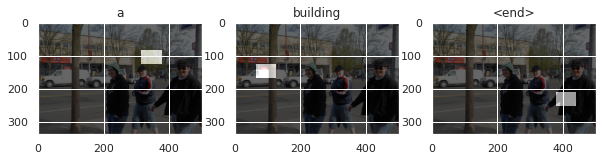

time took to Predict: 1 sec


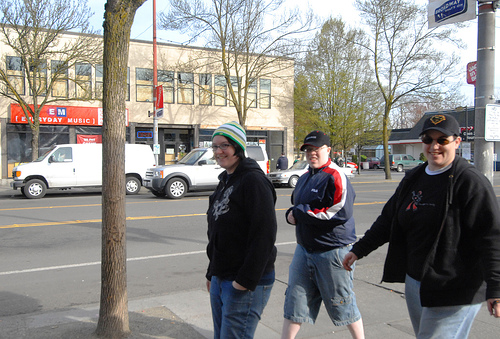

In [381]:
# 1. opening the image
Image.open(Predict_Greedy(img_name_test, 1208))

/root/.keras/datasets/Flicker8k_Dataset/2623982903_58ec7c5026.jpg
rid: 2010
BELU score: 0
Real Caption: several dogs running a race on a dirt track while wearing numbers
Prediction Caption: ['a', 'track',
len(result)-0: 3
len(result)  : 3
nrow: 1


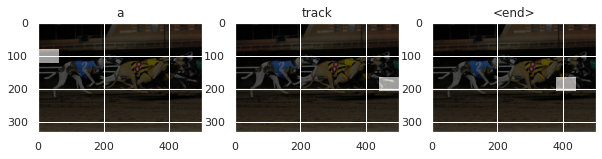

time took to Predict: 1 sec


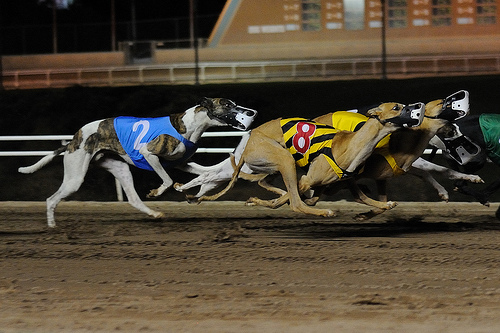

In [300]:
# 2. opening the image
Image.open(Predict_Greedy(img_name_test))

/root/.keras/datasets/Flicker8k_Dataset/2895966469_53e0b29295.jpg
rid: 6758
BELU score: 0
Real Caption: a kayaker battles the rapids
Prediction Caption: ['a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man', 'in', 'a', 'man',
len(result)-init: 39
len(result)-post: 24
nrow: 3


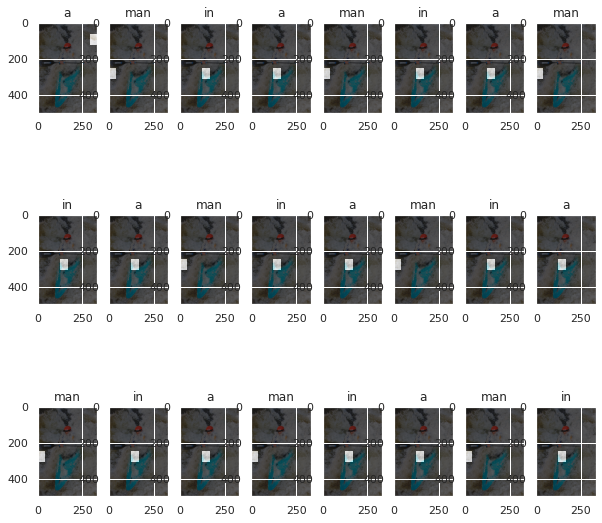

time took to Predict: 6 sec


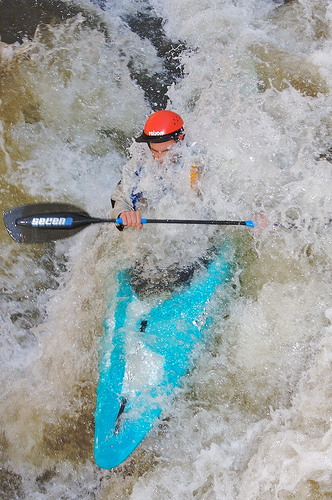

In [382]:
# 3. opening the image
Image.open(Predict_Greedy(img_name_test, 6758))

### Beam Search(b=3) ###

In [0]:
# BEAM: captions on the validation set
from PIL import Image
from nltk.translate.bleu_score import sentence_bleu

def Predict_Beam(img_name_test, beam=3, rid=1234): 
    if rid==1234:
        rid = np.random.randint(0, len(img_name_test))
    image = img_name_test[rid]
    #image = 'Flicker8k_Dataset/413231421_43833a11f5.jpg'
    print(image)
    start = time.time()
    real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
    result, attention_plot = evaluate_beam(image, beam)

    # result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
    # We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in result:
        if i=="<unk>":
            result.remove(i)

    #remove <end> from result         
    result_join = ' '.join(result)
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = result_final.split()

    score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
    print(f"BELU score: {score*100}")

    print ('Real Caption:', real_caption)
    print (f'Prediction Caption(Beam={beam}):', result_final)
    print('rid: ' + str(rid))

    plot_attention(image, result, attention_plot)

    print(f"time took to Predict: {round(time.time()-start)} sec")

    return(image)


/root/.keras/datasets/Flicker8k_Dataset/2774430374_fee1d793e7.jpg


/usr/local/lib/python3.6/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


BELU score: 11.547005383792518
Real Caption: a little boy playing baseball outside wearing flip flops
Prediction Caption(Beam=3): a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a
rid: 1289
len(result)-0: 113
len(result)  : 24
nrow: 3


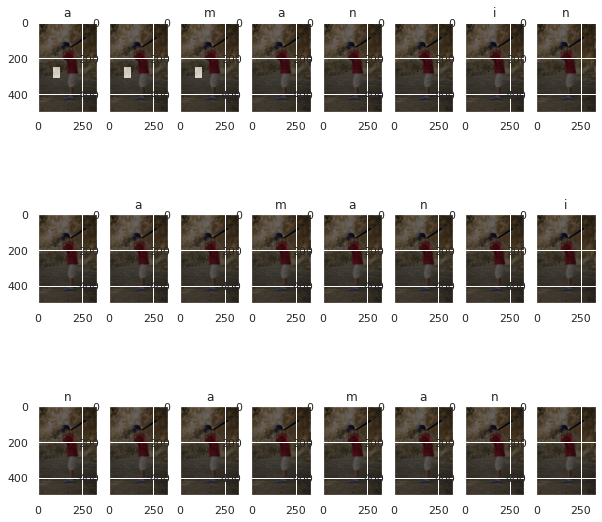

time took to Predict: 7 sec


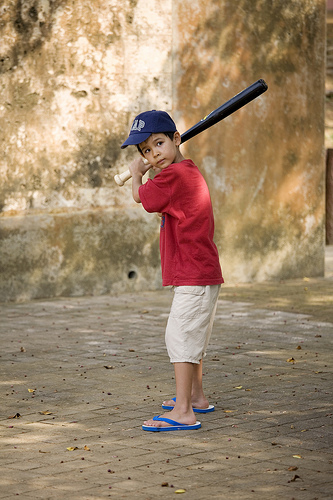

In [346]:
# Real Caption: a little boy playing baseball outside wearing flip flops
# BEAM 3
Image.open(Predict_Beam(img_name_test, 3, 1289))    # 5692, 5692, 4973

# Beam Search(b=7) #

/root/.keras/datasets/Flicker8k_Dataset/2774430374_fee1d793e7.jpg


/usr/local/lib/python3.6/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


BELU score: 11.547005383792518
Real Caption: a little boy playing baseball outside wearing flip flops
Prediction Caption(Beam=7): a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a
rid: 1289
len(result)-init: 113
len(result)-post: 24
nrow: 3


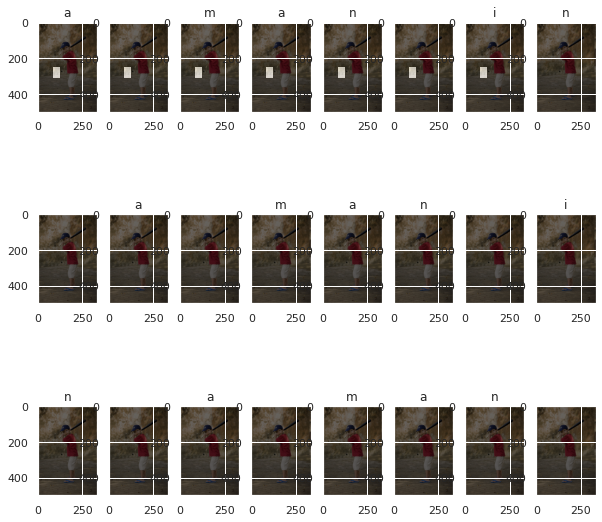

time took to Predict: 11 sec


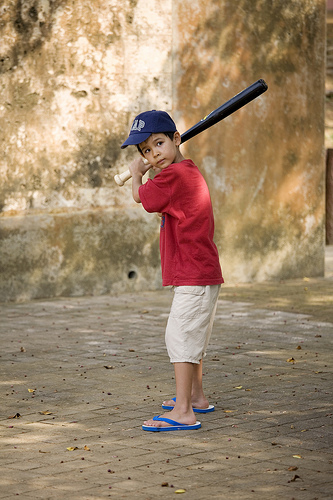

In [348]:
# Real Caption: a little boy playing baseball outside wearing flip flops
# BEAM 7
Image.open(Predict_Beam(img_name_test, 7, 1289))    # 5692, 5692, 4973

# Beam Search(b=16) #

/root/.keras/datasets/Flicker8k_Dataset/2774430374_fee1d793e7.jpg


/usr/local/lib/python3.6/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


BELU score: 11.547005383792518
Real Caption: a little boy playing baseball outside wearing flip flops
Prediction Caption(Beam=16): a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a n   i n   a   m a
rid: 1289
len(result)-init: 113
len(result)-post: 24
nrow: 3


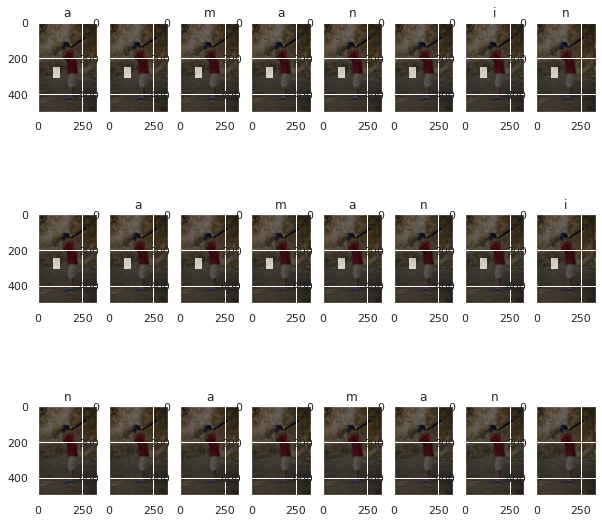

time took to Predict: 25 sec


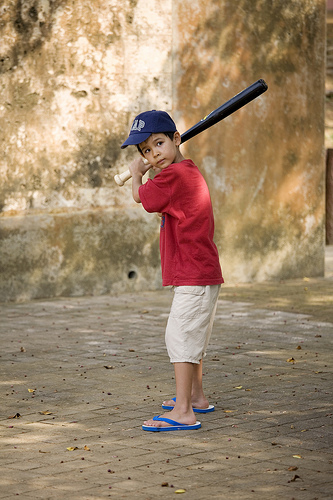

In [350]:
# Real Caption: a little boy playing baseball outside wearing flip flops
# BEAM 10
Image.open(Predict_Beam(img_name_test, 16, 1289))    # 5692, 5692, 4973

### 4. Greedy Search ###

## Try captions on Validation Set ##
### 5. Greedy Search ###

In [0]:
# captions on the validation set
from PIL import Image
from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)

#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

### 7. Beam Search(b=3) ###

In [0]:
# captions on the validation set
from PIL import Image
from nltk.translate.bleu_score import sentence_bleu

def Predict_Beam_Search(beam=3, image_file='413231421_43833a11f5.jpg'):
    #rid = np.random.randint(0, len(img_name_test))
    image = image_dir + '/' + image_file
    print(image)
    start = time.time()
    real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
    result, attention_plot = evaluate_beam(image, 8)

    # result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
    # We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in result:
        if i=="<unk>":
            result.remove(i)

    #remove <end> from result         
    result_join = ' '.join(result)
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = result_final.split()

    score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
    print(f'BELU score: {score*100}')

    print ('Real Caption:', real_caption)
    print ('Prediction Caption(Beam=3):', result_final)

    plot_attention(image, result, attention_plot)

    print(f"time took to Predict: {round(time.time()-start)} sec")

    return image


/root/.keras/datasets/Flicker8k_Dataset/413231421_43833a11f5.jpg


/usr/local/lib/python3.6/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


BELU score: 17.96053020267749
Real Caption: the group of people is holding a large sheet
Prediction Caption(Beam=3): a   b l a c k   d o g   i s   r u n n i n g   t h r o u g h   t h e   s n o
len(result)-init: 39
len(result)-post: 24
nrow: 3


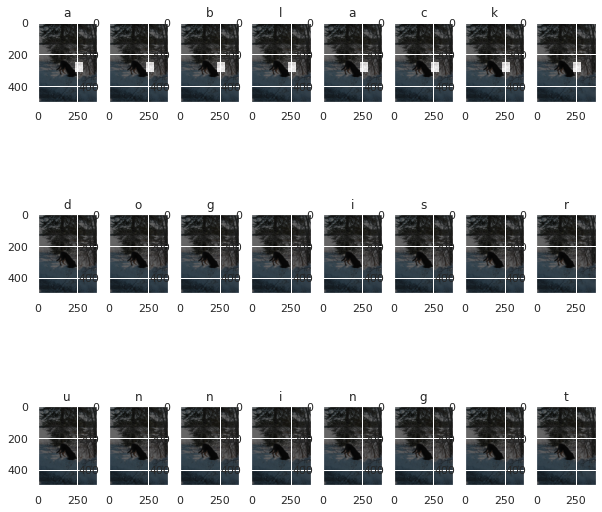

time took to Predict: 12 sec


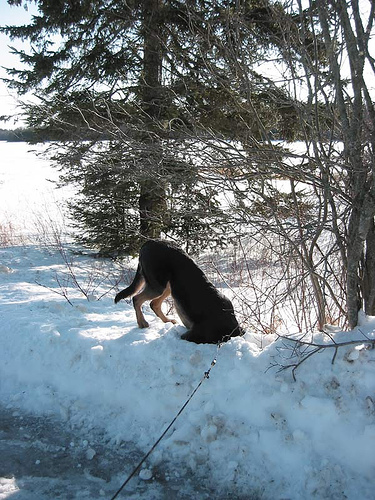

In [356]:
# BEAM 3 
beam=3
Image.open(Predict_Beam_Search(beam, '413231421_43833a11f5.jpg'))

/root/.keras/datasets/Flicker8k_Dataset/413231421_43833a11f5.jpg
BELU score: 0
Real Caption: three colorful clowns with <unk> posing next to another plastic clown
Prediction Caption(Beam=3): a   b l a c k   d o g   i s   r u n n i n g   t h r o u g h   t h e   s n o
len(result)-init: 39
len(result)-post: 24
nrow: 3


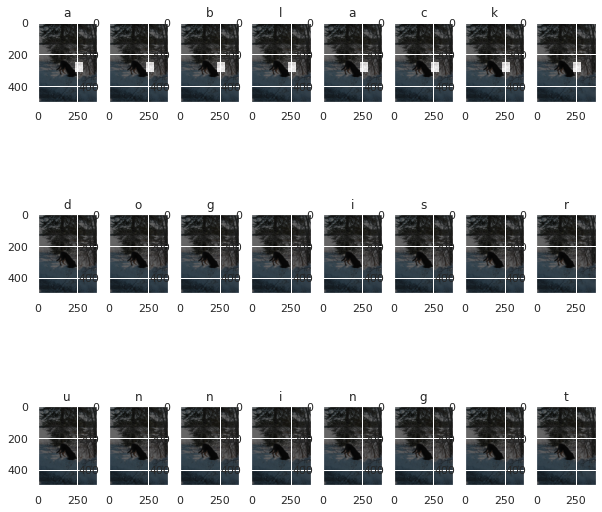

time took to Predict: 12 sec


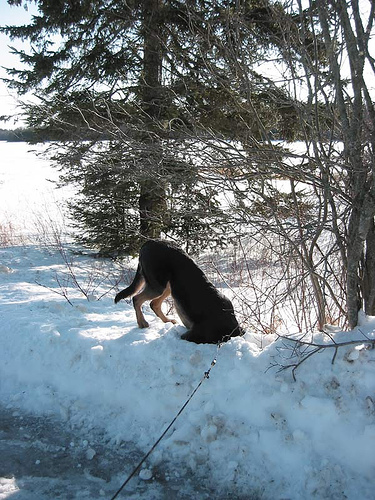

In [357]:
# BEAM 16
beam=16
Image.open(Predict_Beam_Search(beam, '413231421_43833a11f5.jpg'))

/root/.keras/datasets/Flicker8k_Dataset/270809922_043e3bef06.jpg


/usr/local/lib/python3.6/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


BELU score: 23.618327637050733
Real Caption: a woman with a hat is leading a small dog through an obstacle course
Prediction Caption(Beam=3): a   m o u n t a i
len(result)-init: 10
len(result)-post: 8
nrow: 2


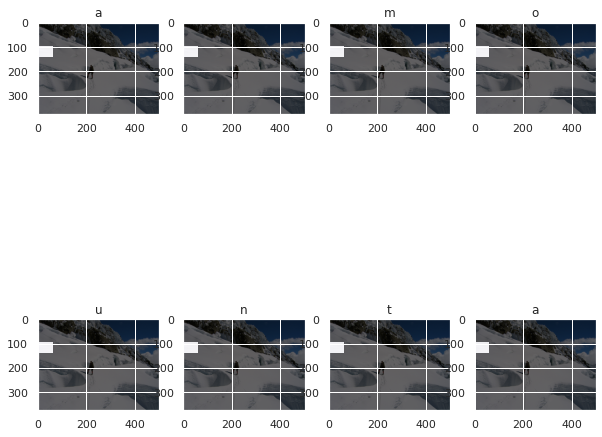

time took to Predict: 8 sec


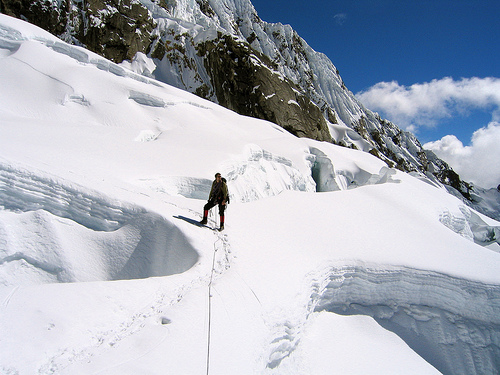

In [383]:
# BEAM 16
beam=16
Image.open(Predict_Beam_Search(beam, '270809922_043e3bef06.jpg'))

# Inception Model ( for reference )#

In [0]:
def preprocess(image_path):
    # Convert all the images to size 299x299 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    x = preprocess_input(x)
    return x

# Feature Extraction
Create an InceptionV3 model as a feature extractor.  This will create a 2,048 element vector as the output.  Since, the top layer is not included, average pooling is applied at the end to convert from a 4D tensor to a 2D tensor.

In [0]:
model_new = InceptionV3(include_top=False, weights='imagenet', input_shape=(299, 299, 3), pooling='avg')

87916544/87910968 [==============================] - 1s 0us/step


Below is a function to extract the features of the image.  It will 'predict' on the image to get a 2,048 element output.

In [0]:
# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

The training set images are passed through the inception model to create the features.  The feature set is then saved as pickle file for use later.

In [0]:
# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
start = time()
encoding_train = {}
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 273.64428329467773


In [0]:
# Save the bottleneck train features to disk
with open("encoded_train_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_train, encoded_pickle) 

The Test set images are also passed through the inception model to create their features.  The feature set is then saved as pickle file for use later.

In [0]:
# Call the funtion to encode all the test images - Execute this only once
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 43.95797562599182


In [0]:
# Save the bottleneck test features to disk
with open("encoded_test_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle) 

Create features for the Validation Set.

In [0]:
# Call the funtion to encode all the Validation images - Execute this only once
start = time()
encoding_val= {}
for img in val_img:
    encoding_val[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 43.277586936950684


In [0]:
# Save the bottleneck test features to disk
with open("encoded_val_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_val, encoded_pickle) 

In [0]:
train_features = pickle.load(open("encoded_train_images.pkl", "rb"))
print('Photos: train=%d' % len(train_features))
val_features = pickle.load(open("encoded_val_images.pkl", "rb"))
print('Photos: val=%d' % len(val_features))

Photos: train=6000
Photos: val=1000


The original vocabulary size is 8,763 which includes rare words that do not help in a general model.  So any words that occur less than 10 times are removed.  An extra 'word' in the vocab list is added for '0', because sentences will be padded with 0 to give them a fixed length in processing.

This gives 1652 words for the model's vocabulary.

In [0]:
# Create a list of all the training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)

# Include validation set as well
#for key, val in val_descriptions.items():
#    for cap in val:
#        all_train_captions.append(cap)
#len(all_train_captions)

In [0]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


Create two dictionaries, one for index to word and one for word to index.  Since the model can only use numeric data, words are converted to a token number and these 2 dictionaries give the mapping from word to token and token to word.

In [0]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [0]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

Calculate the maximum number of words in the training sentences and this will become the length for each sentence.  This length includes the startseq and endseq words we added to each sentence earlier.

In [0]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)


print(max_length(val_descriptions))
# determine the maximum sequence length
max_length = max_length(train_descriptions)
print('Description Length: {}'.format(max_length))

31
Description Length: 34


## Data Generator
A data generator allows data to be processed in batches so that the model does not have to keep all the training data in memeory.  For the RNN, this will have as input the feature vector from the inception model as one input.  The model is predicting the next word in a sequence given the preceding words, so the second input is the increasing sequences of words, for example:
- startseg
- startseg, the
- startseg, the, cat
- startseg, the, cat, is
- startseg, the, cat, is, on
- startseg, the, cat, is, on, the
- startseg, the, cat, is, on, the, grass
- startseg, the, cat, is, on, the, grass, endseq

For each input, the next word is being predicted as Y.

So, the data generator returns the Feature vector, tokens for each increasing sequence and the predictions.

In [0]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length, padding='post')[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [array(X1), array(X2)], array(y) # No brackets around the outside
                X1, X2, y = list(), list(), list()
                n=0

GloVE word embeddings are used to map each word index to a 200 dimensional vectore, giving an embedding matrix.

In [0]:
# Load Glove vectors
embeddings_index = {} # empty dictionary
f = open(os.path.join(root_directory, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [0]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [0]:
embedding_matrix.shape

(1652, 200)

In [0]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 =  Dropout(0.5)(se1)
se3 =  LSTM(256)(se2)
decoder1 =  add([fe2, se3])#, axis=1)
decoder2 =  Dense(256, activation='relu')(decoder1)
outputs =  Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [0]:
model.layers[2]

We can load the embedding matrix that was create from the gloVE embeddings as the weights for the embedding layer and then freeze that layer so the weights remain as is.

In [0]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [0]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(0.001))
              

In [0]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 34)]         0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 2048)]       0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 34, 200)      330400      input_3[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 2048)         0           input_2[0][0]                    
______________________________________________________________________________________________

In [0]:
model_new.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 149, 149, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 149, 149, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [0]:
epochs = 30
number_pics_per_bath = 64
steps = len(train_descriptions)//number_pics_per_bath
val_steps = len(val_descriptions)//number_pics_per_bath

In [0]:
for i in range(epochs):
    train_generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    val_generator = data_generator(val_descriptions, val_features, wordtoix, max_length, number_pics_per_bath)
    model.fit(x=train_generator, epochs=1, steps_per_epoch=steps, verbose=1, validation_data=val_generator, validation_steps=val_steps)

93/93 [==============================] - 20s 213ms/step - loss: 2.5177 - val_loss: 3.2135


In [0]:
val_descriptions['1022454332_6af2c1449a']
val_features['2886411666_72d8b12ce4.jpg']

array([0.43404284, 0.82013285, 0.18612713, ..., 0.54412615, 0.3777435 ,
       0.49981517], dtype=float32)

In [0]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('model_' + str(i) + '.h5')

Epoch 1/1
2000/2000 [==============================] - 167s 84ms/step - loss: 2.6841
Epoch 1/1
2000/2000 [==============================] - 165s 83ms/step - loss: 2.6636
Epoch 1/1
2000/2000 [==============================] - 164s 82ms/step - loss: 2.6372
Epoch 1/1
2000/2000 [==============================] - 164s 82ms/step - loss: 2.6191
Epoch 1/1
2000/2000 [==============================] - 164s 82ms/step - loss: 2.5997
Epoch 1/1
2000/2000 [==============================] - 165s 82ms/step - loss: 2.5839
Epoch 1/1
2000/2000 [==============================] - 163s 82ms/step - loss: 2.5658
Epoch 1/1
2000/2000 [==============================] - 164s 82ms/step - loss: 2.5505
Epoch 1/1
2000/2000 [==============================] - 164s 82ms/step - loss: 2.5380
Epoch 1/1
2000/2000 [==============================] - 164s 82ms/step - loss: 2.5296


In [0]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(0.0001)) # Recompile with a lower learning rate for last 10 epochs
epochs = 30
number_pics_per_bath = 64
steps = len(train_descriptions)//number_pics_per_bath

In [0]:
for i in range(epochs):
    train_generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    val_generator = data_generator(val_descriptions, val_features, wordtoix, max_length, number_pics_per_bath)
    model.fit(x=train_generator, epochs=1, steps_per_epoch=steps, verbose=1, validation_data=val_generator, validation_steps=val_steps)

93/93 [==============================] - 20s 218ms/step - loss: 2.3787 - val_loss: 3.1770


In [0]:
model.save_weights('drive/My Drive/model_ic.h5')

In [0]:
model.load_weights('drive/My Drive/model_ic.h5')

ValueError: ignored

In [0]:
!ls 'drive/My Drive'

In [0]:
images = root_directory + 'Flicker8k_Dataset/'

In [0]:
with open("encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = pickle.load(encoded_pickle)

In [0]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final


Create the Test descriptions for BLEU scores.  A smoothing function is used to avoid where there are 0 overlaps between n-grams.  This gives better results, with the BLEU score going from BLEU-1 to BLEU-4.

## Beam Search

In [0]:
# cumulative BLEU scores
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
cc = SmoothingFunction()
bleu_1 = 0
bleu_2 = 0
bleu_3 = 0
bleu_4 = 0
i = 0

nkeep = 5
pred_good, pred_bad, bleus = [], [], [] 


for pic in encoding_test.keys():
  #  image = encoding_test[pic].reshape((1,2048))   
    fname, ext = pic.split('.')
    caption = beam_search_predictions(pic, 10) # Do prediction
  #  caption = greedySearch(image) # Do prediction
    predicted = caption.split()
    actual = [d.split() for d in descriptions[fname]]
    if len(predicted) < 3:
      print(caption)
    i += 1
    if i % 200 == 0:
       print("Processed {} {} {} {} {}".format(i, bleu_1/i, bleu_2/i, bleu_3/i, bleu_4/i))
    bleu = sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_1 += sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_2 += sentence_bleu(actual, predicted, weights=(0, 1, 0, 0), smoothing_function=cc.method4)
    bleu_3 += sentence_bleu(actual, predicted, weights=(0, 0, 1, 0), smoothing_function=cc.method4)
    bleu_4 += sentence_bleu(actual, predicted, weights=(0, 0, 0, 1), smoothing_function=cc.method4)

    bleus.append(bleu)
    if bleu > 0.8:# and len(pred_good) < nkeep:
        pred_good.append((bleu,pic,descriptions[fname],caption))
    elif bleu < 0.2:# and len(pred_bad) < nkeep:
        pred_bad.append((bleu,pic,descriptions[fname],caption))
  
print('BLEU-1: {} '.format(bleu_1 / len(encoding_test.keys())))
print('BLEU-2: {} '.format(bleu_2 / len(encoding_test.keys())))
print('BLEU-3: {} '.format(bleu_3 / len(encoding_test.keys())))
print('BLEU-4: {} '.format(bleu_4 / len(encoding_test.keys())))

Processed 200 0.4581849342904522 0.278415430027501 0.20988750024548977 0.17739143071581612
Processed 400 0.4596141149557246 0.2827418477670668 0.21372450965711778 0.17867002265653006
Processed 600 0.46446241627525325 0.28267051649240765 0.21702660279079558 0.17857388025673193
Processed 800 0.4593473791700665 0.2823352265825109 0.21746824311634005 0.1782177378161138
Processed 1000 0.4661767924364942 0.2830715128309834 0.21817658672608067 0.1803957942126664
BLEU-1: 0.46645895301145773 
BLEU-2: 0.28324080917596156 
BLEU-3: 0.2183532848445302 
BLEU-4: 0.18054197743652842 


## Greedy Search

In [0]:
# cumulative BLEU scores
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
cc = SmoothingFunction()
bleu_1 = 0
bleu_2 = 0
bleu_3 = 0
bleu_4 = 0
i = 0

nkeep = 5
pred_good, pred_bad, bleus = [], [], [] 


for pic in encoding_test.keys():
    image = encoding_test[pic].reshape((1,2048))   
    fname, ext = pic.split('.')
  #  caption = beam_search_predictions(pic) # Do prediction
    caption = greedySearch(image) # Do prediction
    predicted = caption.split()
    actual = [d.split() for d in descriptions[fname]]
    if len(predicted) < 3:
      print(caption)
    i += 1
    if i % 200 == 0:
       print("Processed {} {} {} {} {}".format(i, bleu_1/i, bleu_2/i, bleu_3/i, bleu_4/i))
    bleu = sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_1 += sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_2 += sentence_bleu(actual, predicted, weights=(0, 1, 0, 0), smoothing_function=cc.method4)
    bleu_3 += sentence_bleu(actual, predicted, weights=(0, 0, 1, 0), smoothing_function=cc.method4)
    bleu_4 += sentence_bleu(actual, predicted, weights=(0, 0, 0, 1), smoothing_function=cc.method4)

    bleus.append(bleu)
    if bleu > 0.8:# and len(pred_good) < nkeep:
        pred_good.append((bleu,pic,descriptions[fname],caption))
    elif bleu < 0.2:# and len(pred_bad) < nkeep:
        pred_bad.append((bleu,pic,descriptions[fname],caption))
  
print('BLEU-1: {} '.format(bleu_1 / len(encoding_test.keys())))
print('BLEU-2: {} '.format(bleu_2 / len(encoding_test.keys())))
print('BLEU-3: {} '.format(bleu_3 / len(encoding_test.keys())))
print('BLEU-4: {} '.format(bleu_4 / len(encoding_test.keys())))

Processed 200 0.4926389517948941 0.2838097802049142 0.23311425198830724 0.18561956342517047
Processed 400 0.4855410163441142 0.2792681570061865 0.2270153262020797 0.1846398346922852
Processed 600 0.48704790935871906 0.2797172033037361 0.22322323490093746 0.18121430194837587
Processed 800 0.48879556925727546 0.28190882996048905 0.22398172048517678 0.1815231000500501
Processed 1000 0.4865760983981904 0.2810665367541944 0.2228594275022999 0.18281236799963002
BLEU-1: 0.48714041954811743 
BLEU-2: 0.2814051294441507 
BLEU-3: 0.22303612562074943 
BLEU-4: 0.18295855122349203 


Amended from https://fairyonice.github.io/Develop_an_image_captioning_deep_learning_model_using_Flickr_8K_data.html

Bad Caption


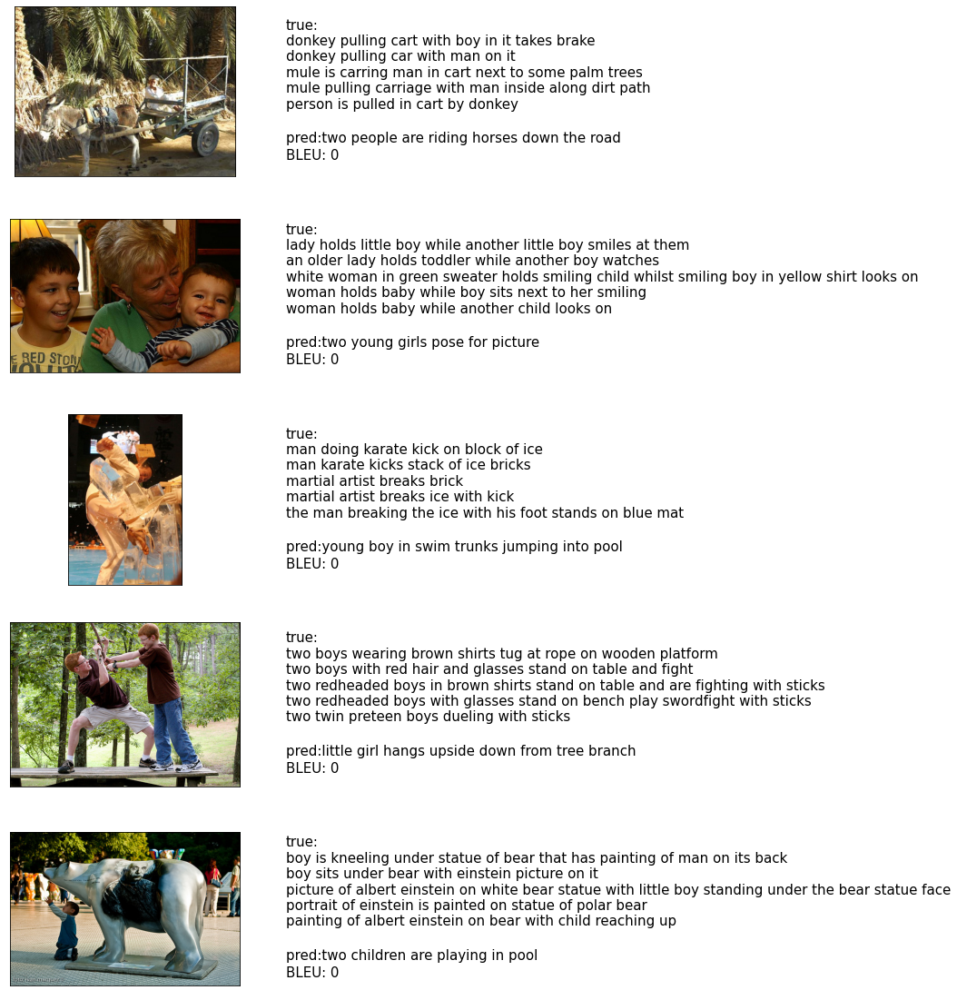

Good Caption


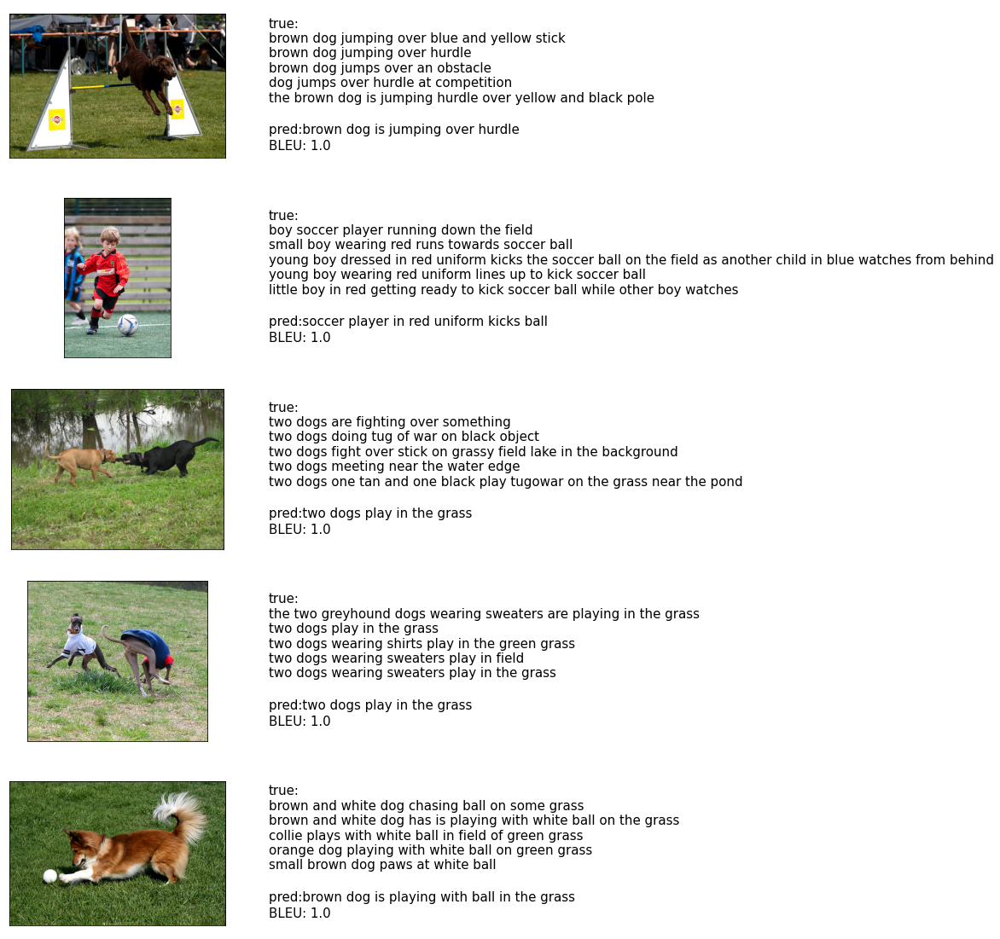

In [0]:
def plot_images(pred_bad, type='good', npic=5):
    def create_str(caption_true):
        strue = ""
        for s in list(caption_true):
            strue += "\n" + s
        return(strue)
    npix = 224
    target_size = (npix,npix,3)    
    count = 1
    pred = pred_bad.copy()
    pred.sort()
    # Either get top n (good) or bottom n (bad) images to show
    if type == 'good':
       pred = pred[-npic:]
    else:
       pred = pred[:npic]
    fig = plt.figure(figsize=(10,npic*4))
    for pb in pred:
        bleu,pic,actual,caption = pb
        ## images - get image from array, reshape and display in column 1
        image = encoding_test[pic].reshape((1,2048))
        x=plt.imread(images+pic)
        ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
        ax.imshow(x)
        count += 1
        ## Text - get true descriptions, predicted and BLEU-1 score and display in column 2
        actual = create_str(actual) # Split the 5 descriptions to separate lines
        
        ax = fig.add_subplot(npic,2,count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,1)
        ax.text(0,0.4,"true:" + actual,fontsize=15)
        ax.text(0,0.2,"pred:" + caption,fontsize=15)
        ax.text(0,0.1,"BLEU: {}".format(bleu),fontsize=15)
        count += 1
    plt.show()

print("Bad Caption")
plot_images(pred_bad, 'bad')
print("Good Caption")
plot_images(pred_good, 'good')

In [0]:
def beam_search_predictions(image, beam_index = 3):

    start = [wordtoix["startseq"]]
    
    # start_word[0][0] = index of the starting word
    # start_word[0][1] = probability of the word predicted
    start_word = [[start, 0.0]]
    
    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            par_caps = sequence.pad_sequences([s[0]], maxlen=max_length, padding='post')
            e = encoding_test[image].reshape((1,2048))  
            #e = encoding_test[image[len(images):]]
            preds = model.predict([e, np.array(par_caps)])
            
            # Getting the top <beam_index>(n) predictions
            word_preds = np.argsort(preds[0])[-beam_index:]
            
            # creating a new list so as to put them via the model again
            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])
                    
        start_word = temp
        # Sorting according to the probabilities
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        # Getting the top words
        start_word = start_word[-beam_index:]
    
    start_word = start_word[-1][0]
    intermediate_caption = [ixtoword[i] for i in start_word]

    final_caption = []
    
    for i in intermediate_caption:
        if i != 'endseq':
            final_caption.append(i)
        else:
            break
    
    final_caption = ' '.join(final_caption[1:])
    return final_caption

In [0]:

 #   image = encoding_test[pic].reshape((1,2048))   
 #   fname, ext = pic.split('.')
caption = beam_search_predictions('3715469645_6d1dc019b3.jpg') # Do prediction
print(caption)
#image = encoding_test['3715469645_6d1dc019b3.jpg'].reshape((1,2048))  
#caption = greedySearch(image) # Do prediction
#print(caption)

two girls posing for picture


In [0]:
Ctrl shift i put in console to keep connected
function ConnectButton(){
    console.log("Connect pushed"); 
    document.querySelector("#top-toolbar > colab-connect-button").shadowRoot.querySelector("#connect").click() 
}
setInterval(ConnectButton,60000);